In [5]:
!pip install clipscope
!pip install datasets

INFO: pip is looking at multiple versions of multiprocess to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 471.6/471.6 kB 14.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 10.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 11.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 12.8 MB/s eta 0:00:00


In [40]:
import datasets
import PIL
from clipscope import ConfiguredViT, TopKSAE
import torch
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt

In [10]:
# we pick an easy-to-download image dataset from huggingface at random. Food images in this case.
ds = datasets.load_dataset("ethz/food101", split="validation")

In [11]:
ds

Dataset({
    features: ['image', 'label'],
    num_rows: 25250
})

In [12]:
# ok what does a sample look like?
for sample in ds:
  print(sample)
  break

{'image': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=512x512 at 0x7ABC9B83A740>, 'label': 6}


In [18]:
# load the model and the sparse autoencoder
device='cuda'
filename_in_hf_repo = "725159424.pt"
sae = TopKSAE.from_pretrained(repo_id="lewington/CLIP-ViT-L-scope", filename=filename_in_hf_repo, device=device)

transformer_name='laion/CLIP-ViT-L-14-laion2B-s32B-b82K'
locations = [(22, 'resid')]
transformer = ConfiguredViT(locations, transformer_name, device=device)

activations shape torch.Size([1, 1024])
output keys dict_keys(['reconstruction', 'latent', 'experts_chosen', 'expert_prop', 'expert_weighting', 'active_latents'])
latent shape torch.Size([1, 65536])
reconstruction shape torch.Size([1, 1024])


In [36]:
# accumulate latents for 800 samples
latents = None
count = 0

dl = DataLoader(ds, batch_size=8, shuffle=False, num_workers=1, collate_fn=lambda x: [[y['image'] for y in x], [y['label'] for y in x]])
for sample in dl:
  activations = transformer.all_activations(sample[0])[locations[0]][:, 0]
  output = sae.forward_verbose(activations)
  if latents is None:
    latents = output['latent']
  else:
    latents = torch.cat((latents, output['latent']), dim=0)
  count += 1

  if count == 100:
    break

print(latents.shape)
# since we did not shuffle latents[0] will now correspond to ds[0]

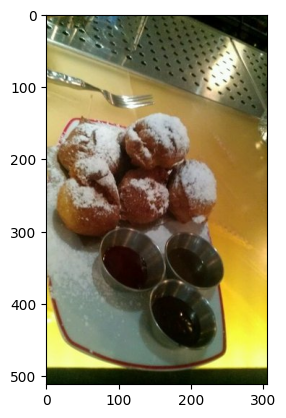

In [41]:
# yup, you can index the dataset and get specific images. nice
plt.imshow(ds[10]['image'])

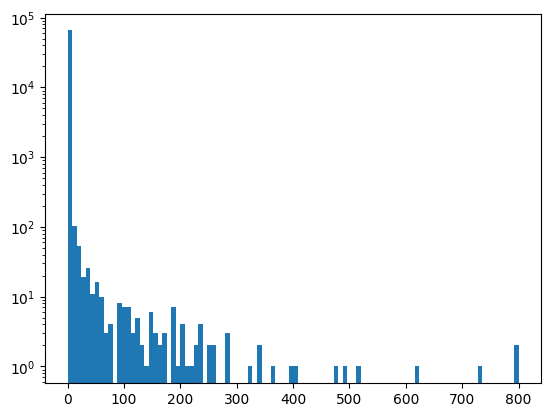

In [43]:
# get a feel for how many latents are active. 
n_active = torch.sum(latents > 0, dim=0)

plt.hist(n_active.cpu().numpy(), bins=100)
plt.yscale('log')

# Most of the latents are always inactive, we would expect this (unless we thought the sparse autoencoder only learned about food).
# But a lot of latents seem to be active 10%-70% of the time, and 6-8 of them seem like they are always active. 
# Would be interesting to dig deeper into what is going on here at some point...

In [61]:
# we select all features which activate more than 100 times across these 800 samples
frequent_feature_idx = torch.nonzero(n_active > 100)[:, 0]
print('number of frequent features', frequent_feature_idx.shape)

# then we get the indices of the top 9 images which activate the most these features
wanted = latents[:, frequent_feature_idx]
top_activating_images = torch.topk(wanted, 9, dim=0).indices.T
print(top_activating_images.shape)

torch.Size([74])
torch.Size([74, 9])


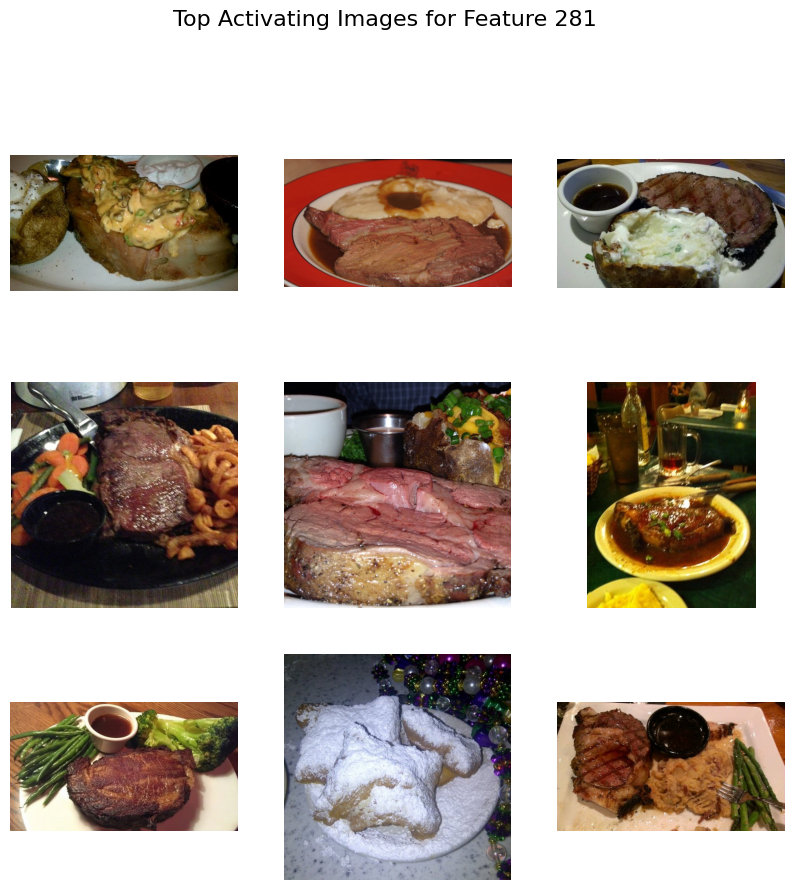

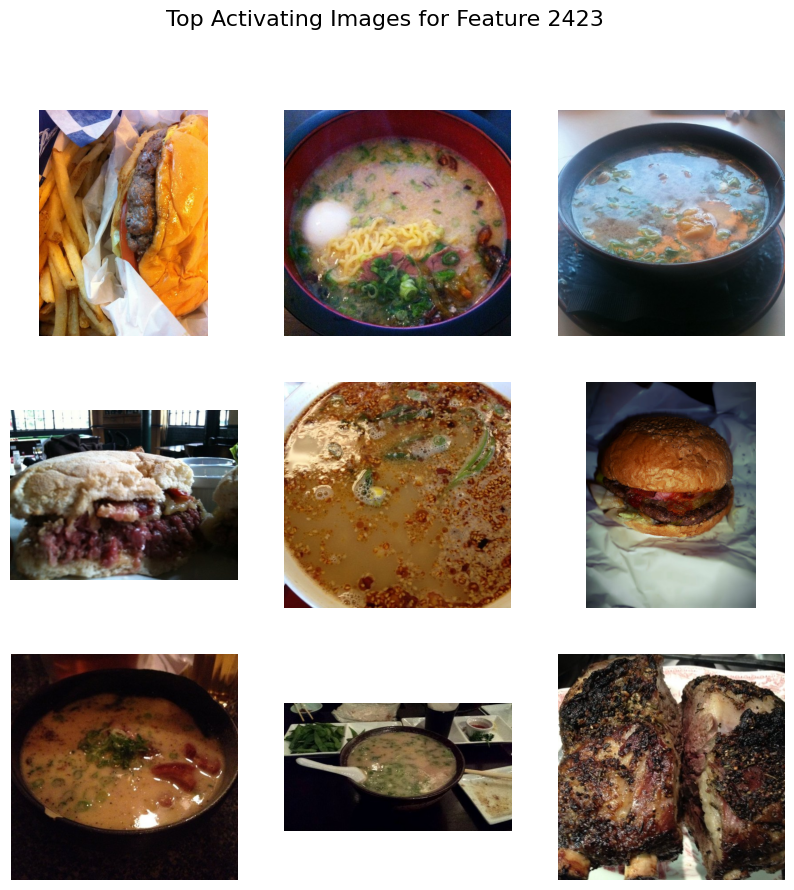

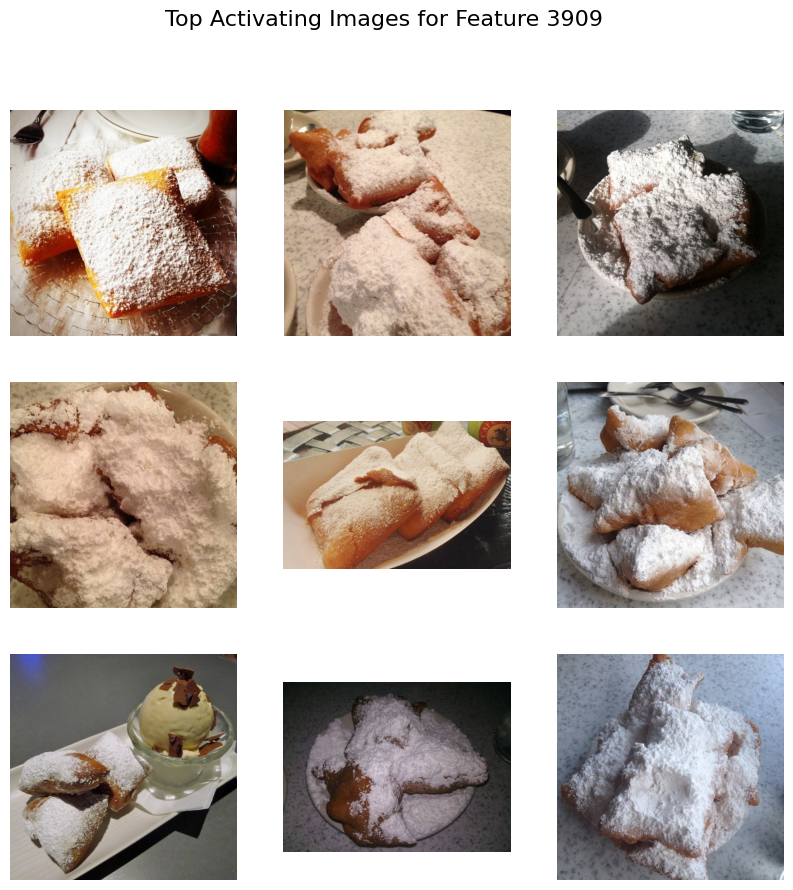

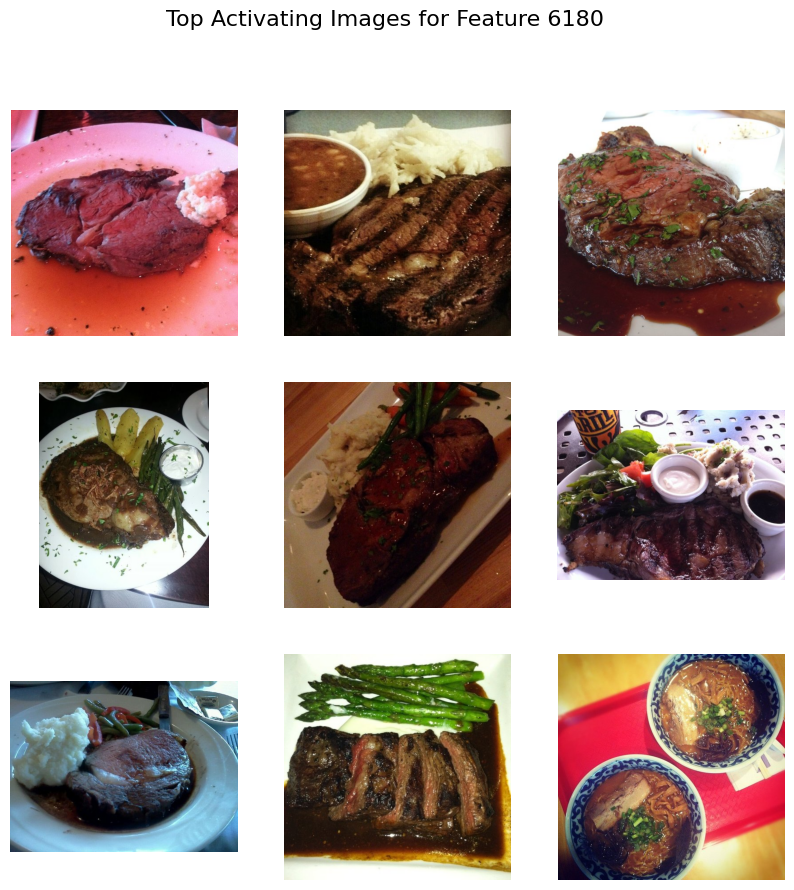

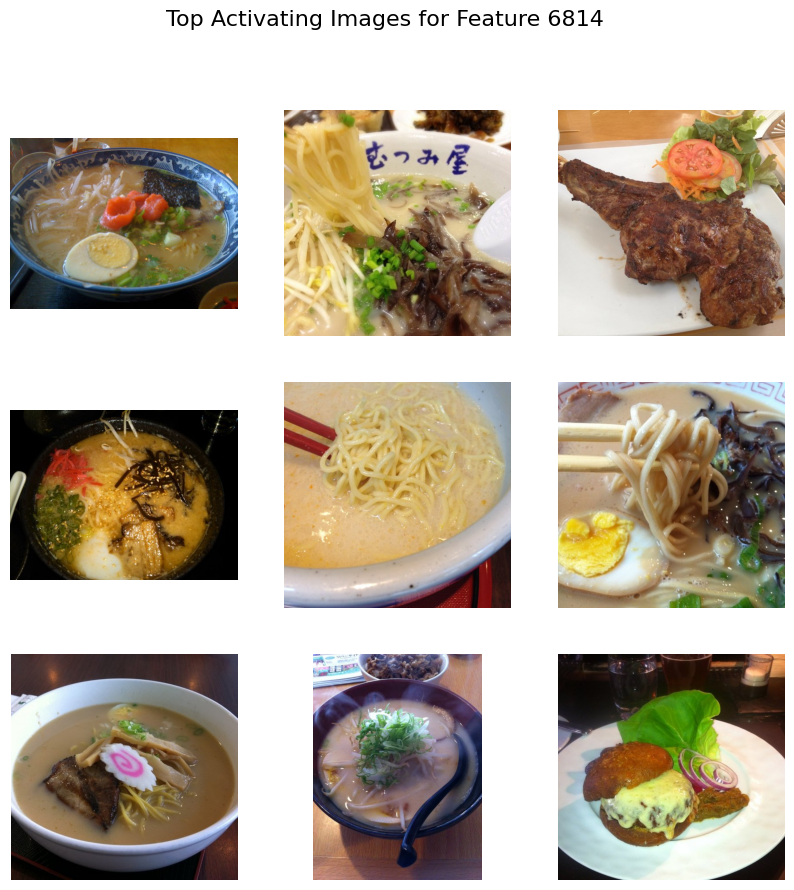

...

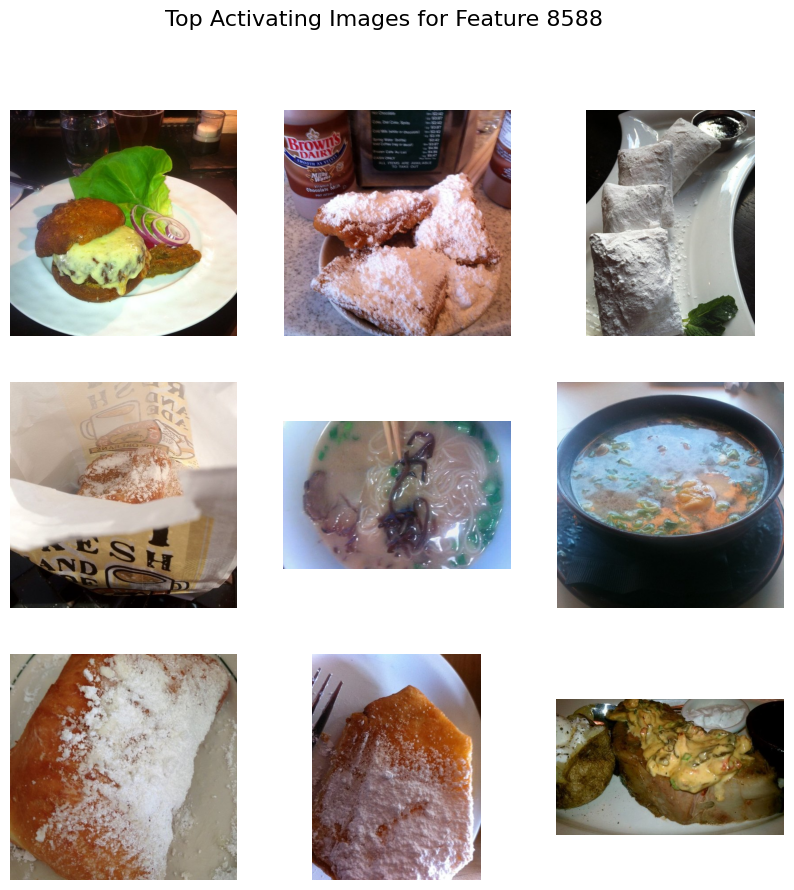

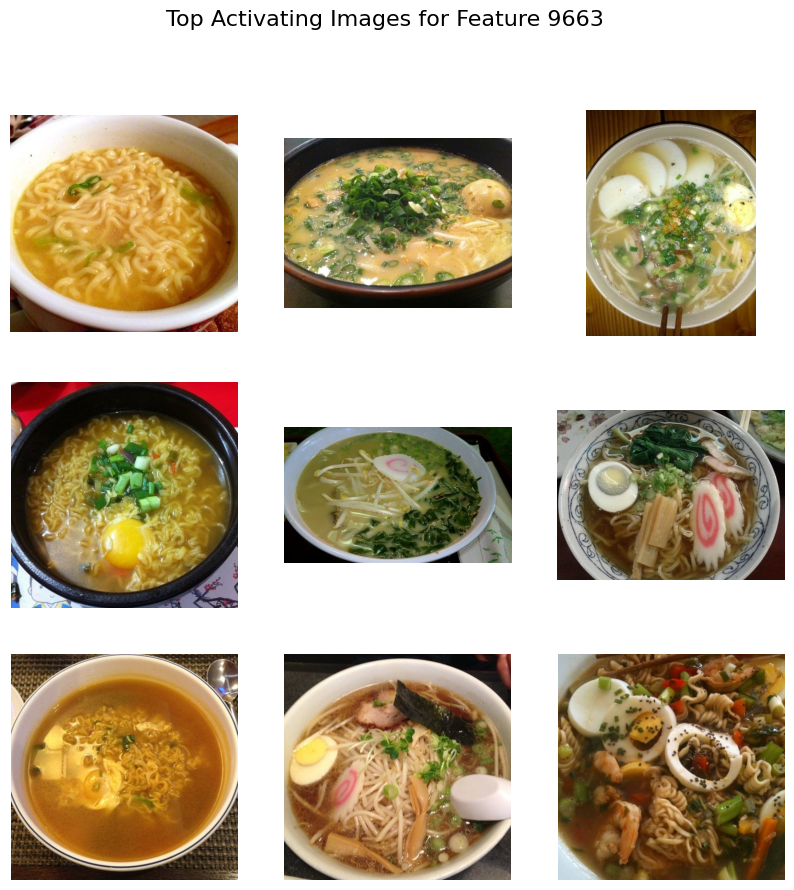

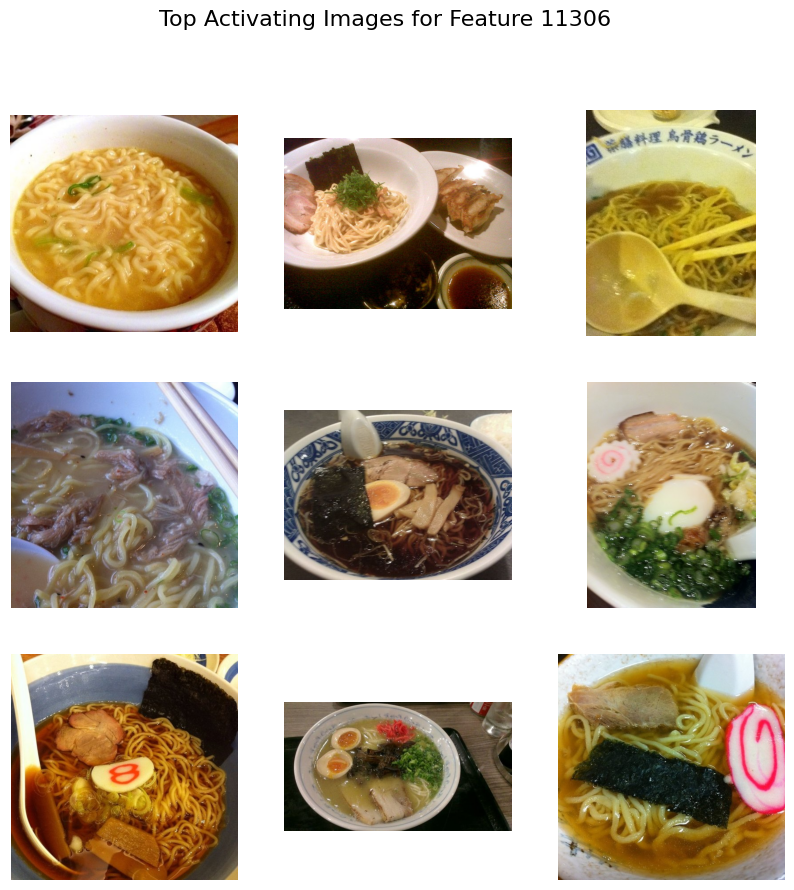

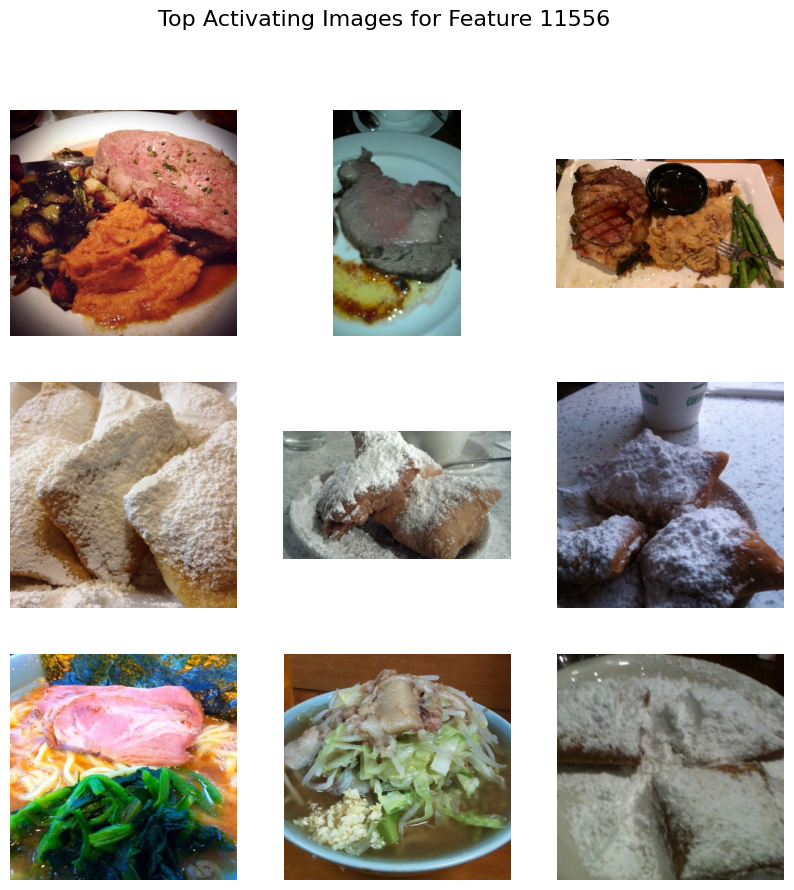

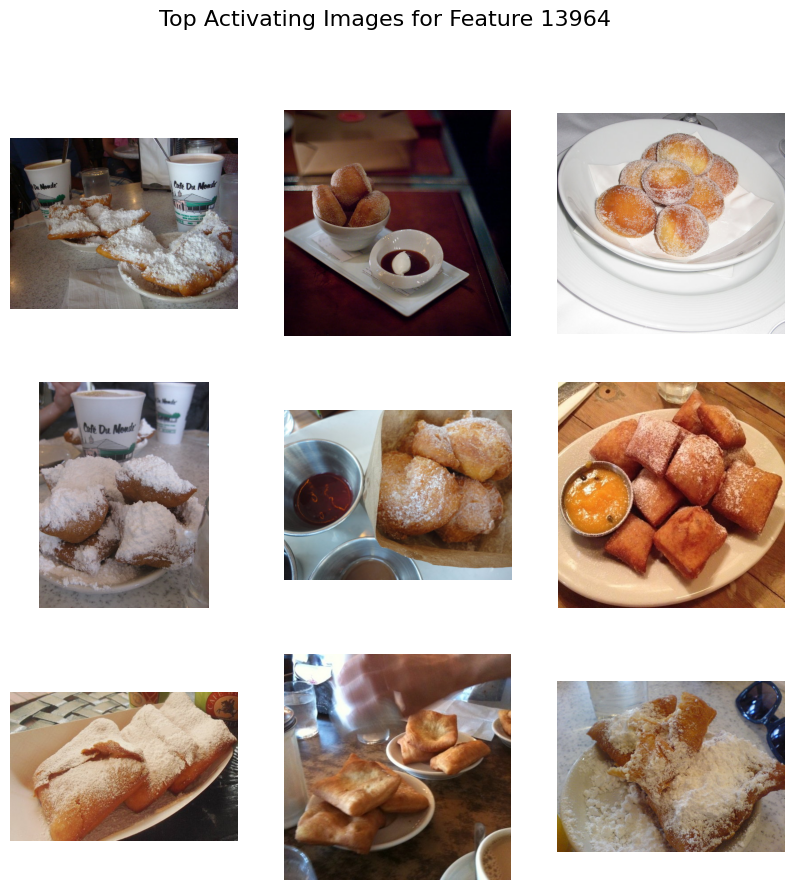

In [62]:
def plot_top_activating_images(top_activating_images, feature_indices, ds, up_to=10):
    for i in range(top_activating_images.shape[0]):
        img_indices = top_activating_images[i].tolist()

        fig, axes = plt.subplots(3, 3, figsize=(10, 10))

        for ax, img_idx in zip(axes.flat, img_indices):
            pil_img = ds[img_idx]['image']

            if not isinstance(pil_img, PIL.Image.Image):
                pil_img = PIL.Image.fromarray(pil_img)

            ax.imshow(pil_img)
            ax.axis('off')  # Hide the axes

        fig.suptitle(f"Top Activating Images for Feature {feature_indices[i]}", fontsize=16)

        plt.show()
        if i == up_to:
          break

# now we plot 3x3 grids for the first 10 of the frequent features
plot_top_activating_images(top_activating_images, frequent_feature_idx, ds)

In [ ]:
# seems somewhat monosemantic, you can really tell the difference between the steak, noodle soup and pastry features at least, and this was just over 800 samples.